Write a program to display the negative of a digital image.

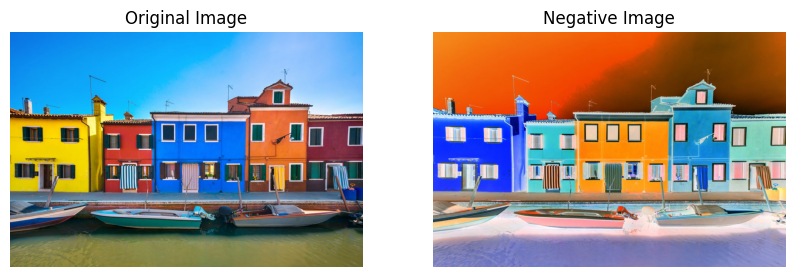

In [ ]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Load the image using PIL
image = Image.open("/content/colourful-buildings.jpg")


if image.mode != "RGB":
    image = image.convert("RGB")

negative_image = ImageOps.invert(image)

original_cv_image = np.array(image)
negative_cv_image = np.array(negative_image)

original_cv_image = cv2.cvtColor(original_cv_image, cv2.COLOR_RGB2BGR)
negative_cv_image = cv2.cvtColor(negative_cv_image, cv2.COLOR_RGB2BGR)

# Plot the images side by side using matplotlib
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image
axes[0].imshow(cv2.cvtColor(original_cv_image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the negative image
axes[1].imshow(cv2.cvtColor(negative_cv_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Negative Image')
axes[1].axis('off')

plt.show()

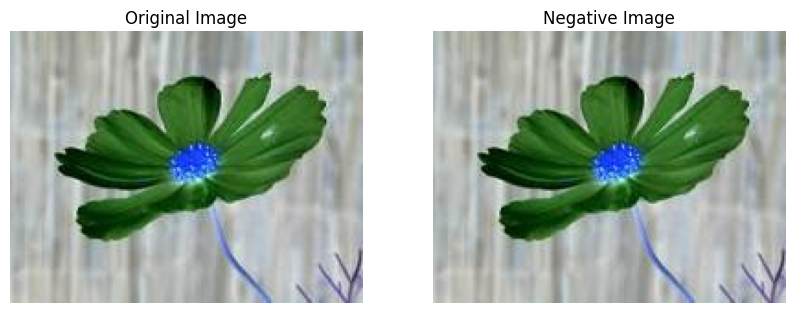

In [ ]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import cv2
import numpy as np

image = Image.open("/content/flower.jpeg")


if image.mode != "RGB":
  image = image.convert("RGB")

#negative transformation function
def neg_trans(img):

  #get width and height of image
  width,height=img.size

  #traverse through pixels
  for x in range(width):
    for y in range(height):

      pixel_color=img.getpixel((x,y))

      #if image is RGB, subtract individual RGB values
      if type(pixel_color) == tuple:

        #s=(L-1)-r
        red_pixel=256-1-pixel_color[0]
        green_pixel=256-1-pixel_color[1]
        blue_pixel=256-1-pixel_color[2]

        #replace the pixel
        img.putpixel((x,y),(red_pixel,green_pixel,blue_pixel))

      #if image is greyscale, subtract pixel intensity
      else:

        #s=(L-1)-r
        pixel_color=256-1-pixel_color

        #replace the pixel
        img.putpixel((x,y),pixel_color)
  return img

neg_img = neg_trans(image)

original_cv_image = np.array(image)
negative_cv_image = np.array(neg_img)

original_cv_image = cv2.cvtColor(original_cv_image, cv2.COLOR_RGB2BGR)
negative_cv_image = cv2.cvtColor(negative_cv_image, cv2.COLOR_RGB2BGR)

# Plot the images side by side using matplotlib
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image
axes[0].imshow(cv2.cvtColor(original_cv_image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the negative image
axes[1].imshow(cv2.cvtColor(negative_cv_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('Negative Image')
axes[1].axis('off')

plt.show()

Write a program to perform the threshold of an input image.

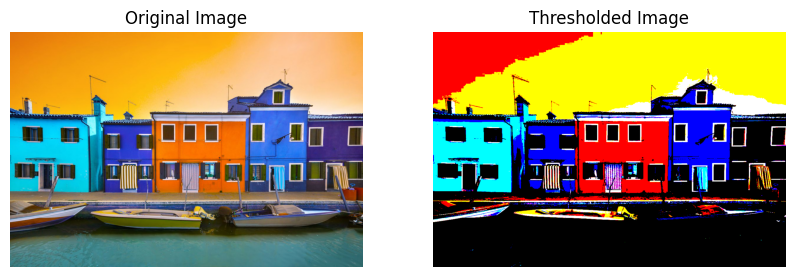

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/colourful-buildings.jpg')

threshold_value = 160
_, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the thresholded image
axes[1].imshow(thresholded_image, cmap='gray')
axes[1].set_title('Thresholded Image')
axes[1].axis('off')

plt.show()

Write a program to perform gray level slicing without background.

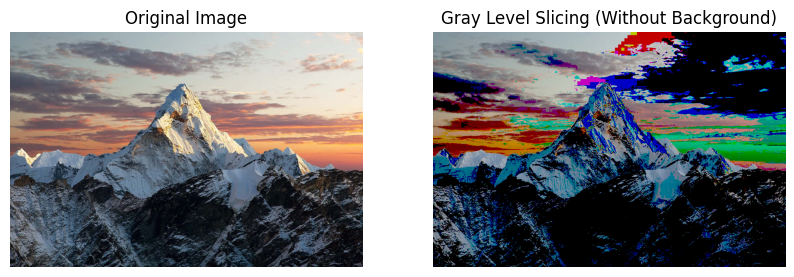

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/mountain.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# gray level range to slice
min_range = 100
max_range = 200

# Create a copy of the image for slicing
sliced_image = np.zeros_like(image_rgb)

# Apply gray level slicing to each channel (R, G, B)
for i in range(3):
    sliced_image[:,:,i] = np.where((image_rgb[:,:,i] >= min_range) & (image_rgb[:,:,i] <= max_range),
                                   image_rgb[:,:,i], 0)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display the original image
axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the sliced image
axes[1].imshow(sliced_image)
axes[1].set_title('Gray Level Slicing (Without Background)')
axes[1].axis('off')

plt.show()

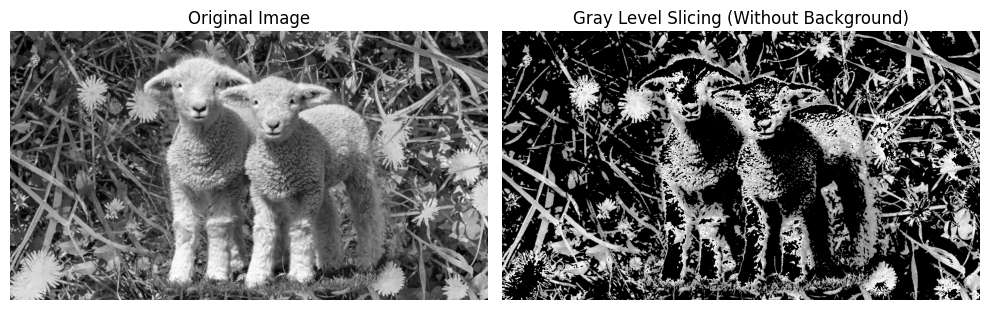

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
img = cv2.imread('sheep.jpg', 0)  # Load image as grayscale

# Find the dimensions of the image
row, column = img.shape

# Create an array of zeros to store the sliced image
img_without_bg = np.zeros((row, column), dtype='uint8')

# Specify the min and max range
min_range = 100
max_range = 200

# Loop through the image and apply gray level slicing without background
for i in range(row):
    for j in range(column):
        if min_range <= img[i, j] <= max_range:
            img_without_bg[i, j] = img[i, j]  # Retain original value
        else:
            img_without_bg[i, j] = 0  # Set to black

# Plot the original and processed images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_without_bg, cmap='gray')
plt.title('Gray Level Slicing (Without Background)')
plt.axis('off')

plt.tight_layout()
plt.show()


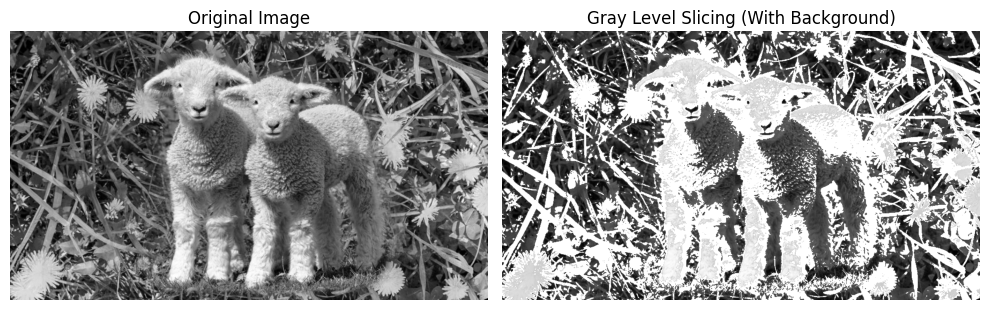

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
img = cv2.imread('sheep.jpg', 0)  # Load image as grayscale

# Find the dimensions of the image
row, column = img.shape

# Create a copy of the image to store the sliced result
img_with_bg = np.copy(img)

# Specify the min and max range
min_range = 100
max_range = 200

# Loop through the image and apply gray level slicing with background
for i in range(row):
    for j in range(column):
        if min_range <= img[i, j] <= max_range:
            img_with_bg[i, j] = 255  # Highlight pixel
        else:
            img_with_bg[i, j] = img[i, j]  # Retain original value

# Plot the original and processed images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_with_bg, cmap='gray')
plt.title('Gray Level Slicing (With Background)')
plt.axis('off')

plt.tight_layout()
plt.show()


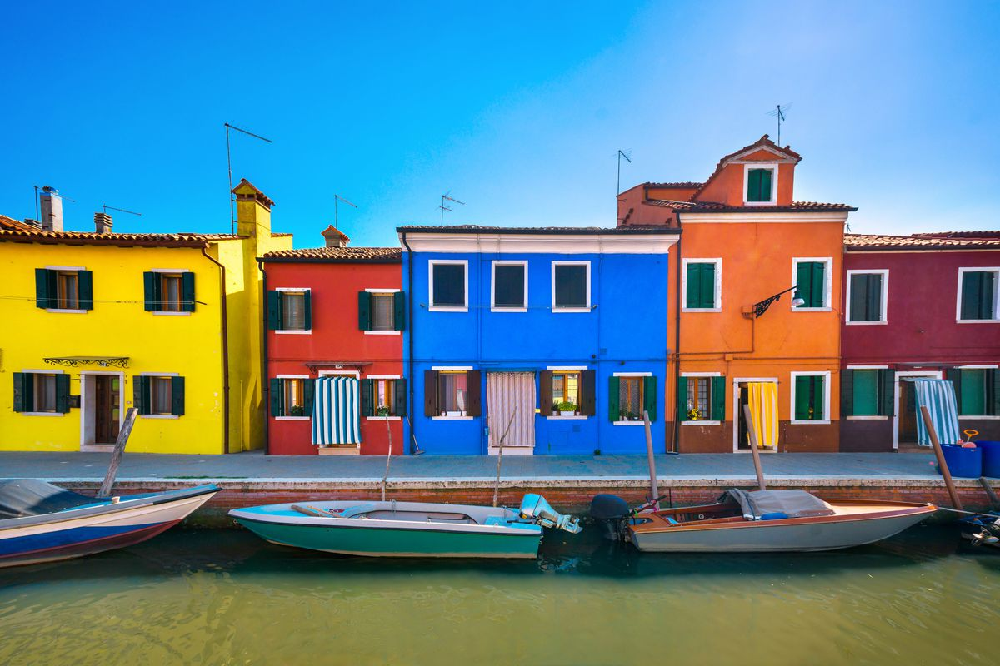

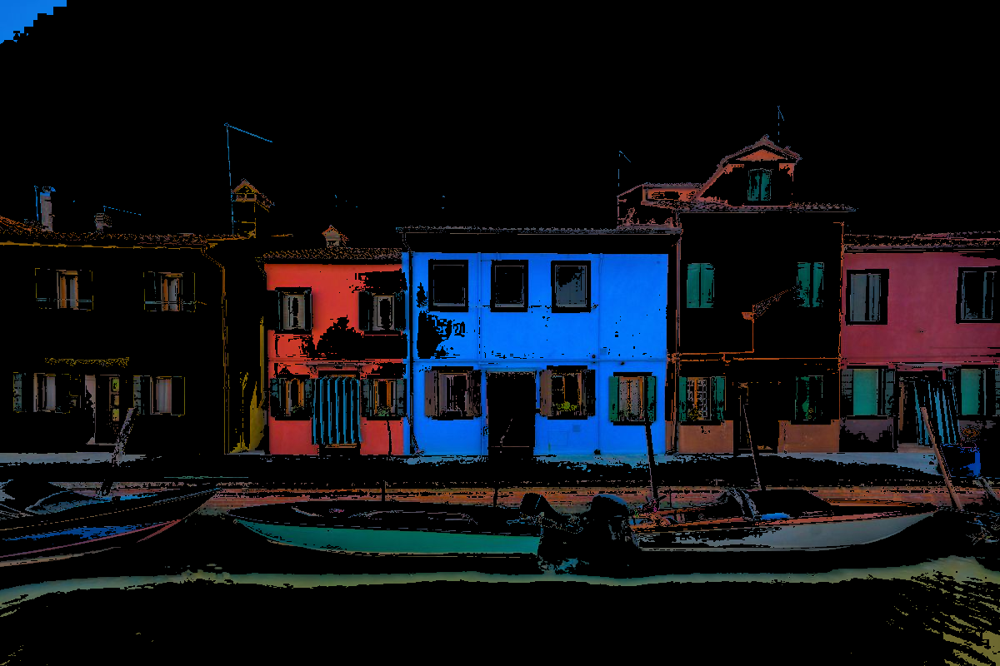

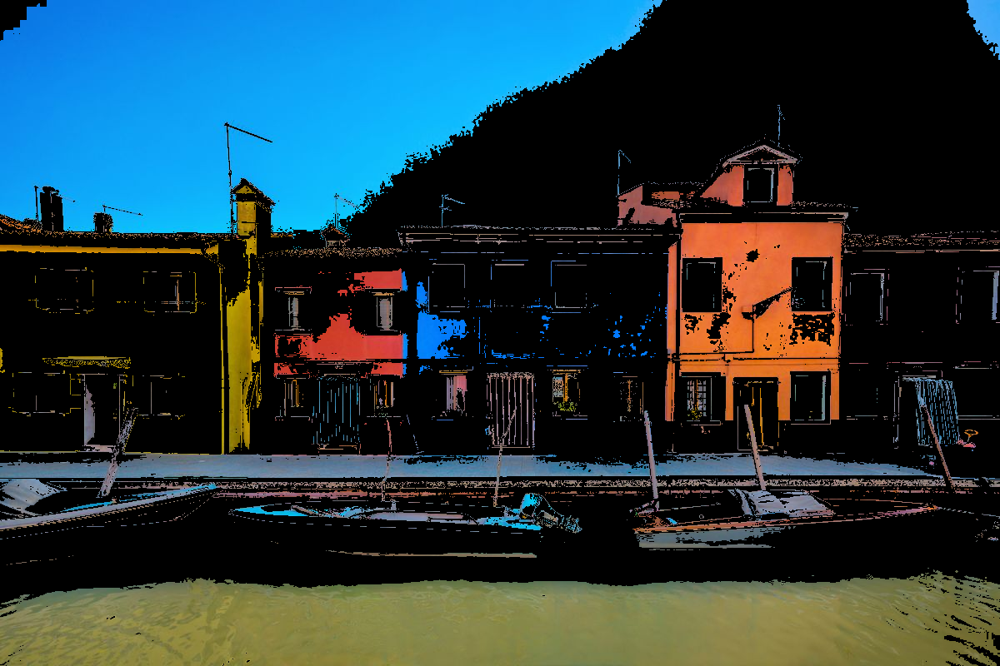

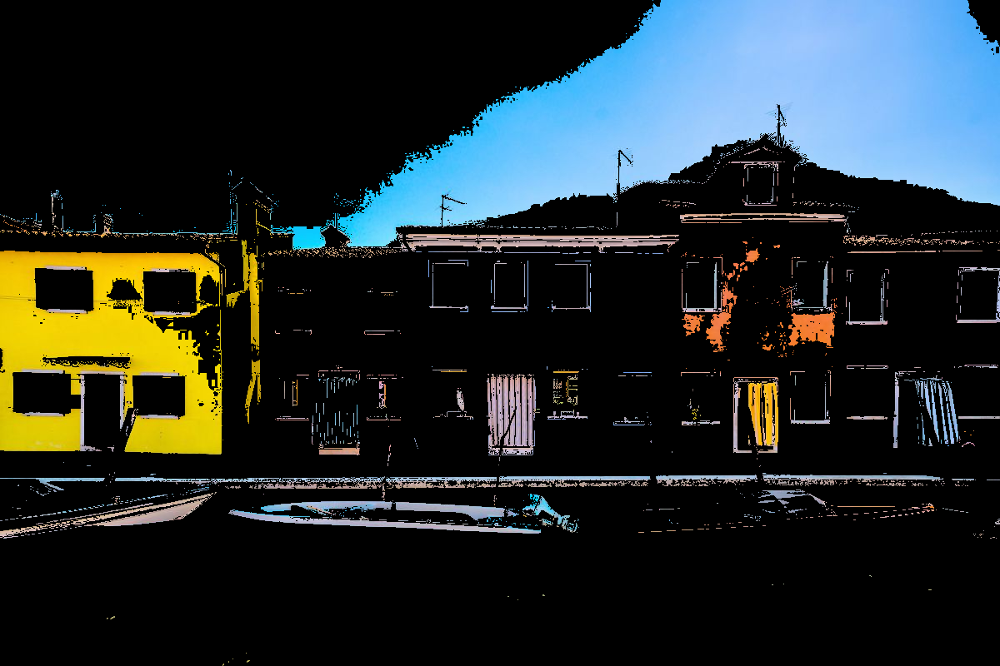

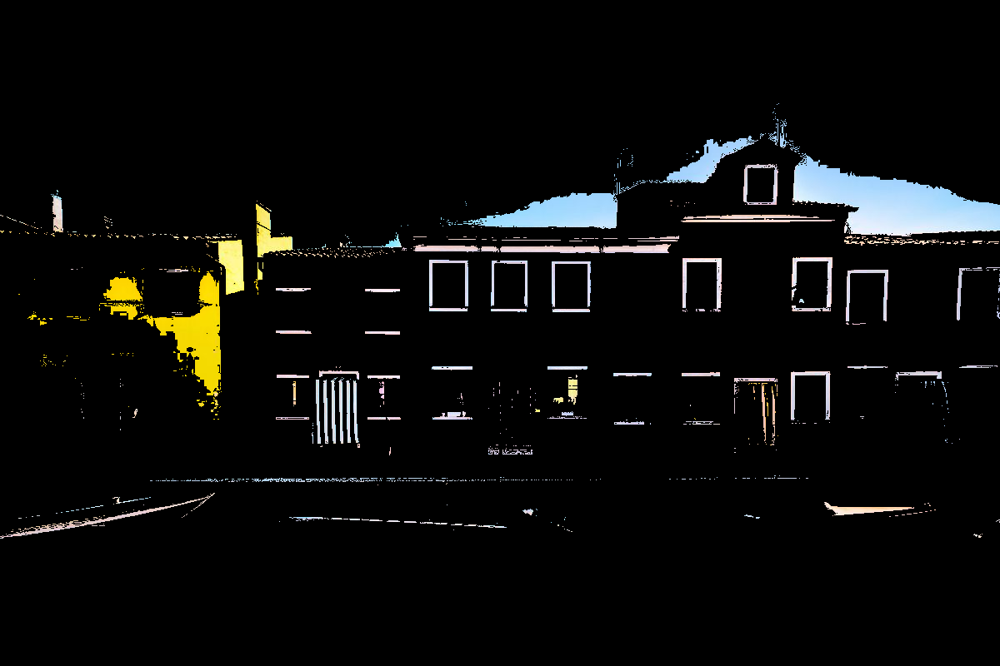

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def gray_level_slicing(image, threshold1, threshold2):
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  mask = np.logical_and(gray_image >= threshold1, gray_image <= threshold2)

  sliced_image = np.zeros_like(image)
  sliced_image[mask] = image[mask]

  return sliced_image

image = cv2.imread('/content/colourful-buildings.jpg')

# Perform gray level slicing
sliced_image0 = gray_level_slicing(image, 50, 100)
sliced_image1 = gray_level_slicing(image, 100, 150)
sliced_image2 = gray_level_slicing(image, 150, 200)
sliced_image3 = gray_level_slicing(image, 200, 250)


cv2_imshow(image)
cv2_imshow(sliced_image0)
cv2_imshow(sliced_image1)
cv2_imshow(sliced_image2)
cv2_imshow(sliced_image3)

Write a program to perform bit-plane slicing.

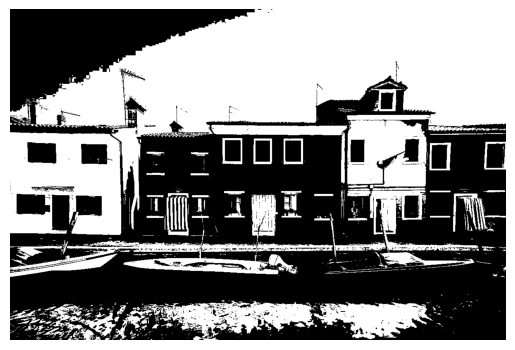

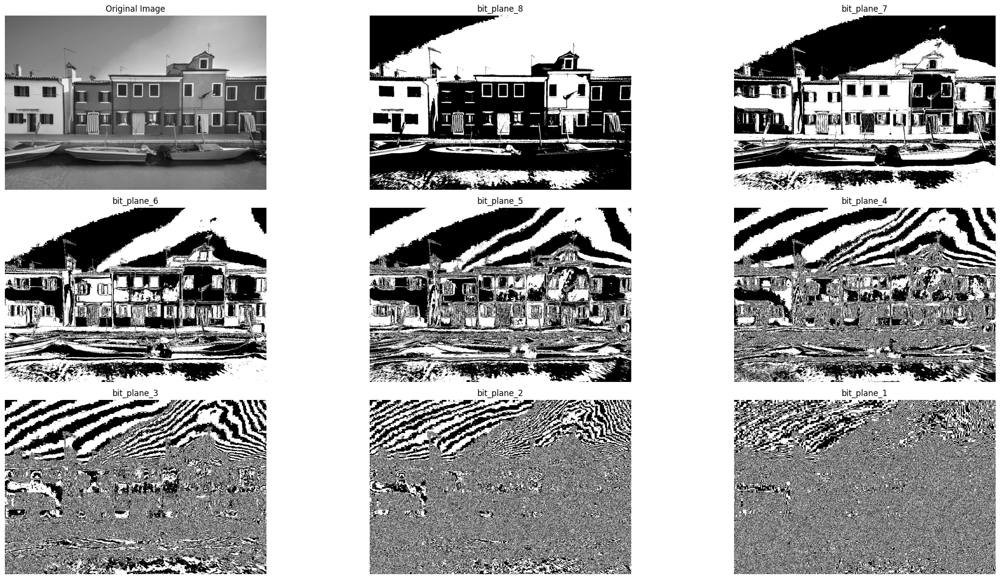

In [ ]:
img = cv2.imread('/content/colourful-buildings.jpg',0)
plt.imshow(img, cmap="gray")
plt.axis('off')
(-0.5, 1191.5, 499.5, -0.5)

def bitPlaneSlicing(r, bit_plane):
    dec = np.binary_repr(r, width = 8)
    return int(dec[8-bit_plane])
bitPlaneSlicingVec = np.vectorize(bitPlaneSlicing)
eight_bitplace = bitPlaneSlicingVec(img, bit_plane = 8)
plt.imshow(eight_bitplace, cmap="gray")

bit_planes_dict = {}
for bit_plane in np.arange(8,0, -1):
    bit_planes_dict['bit_plane_' + str(bit_plane)] = bitPlaneSlicingVec(img, bit_plane = bit_plane)
plt.figure(figsize = (24,12))

plt.subplot(331)
plt.imshow(img, cmap="gray")
plt.title('Original Image')
plt.axis('off')

plt.subplot(332)
plt.imshow(bit_planes_dict['bit_plane_8'], cmap="gray")
plt.title('bit_plane_8')
plt.axis('off')

plt.subplot(333)
plt.imshow(bit_planes_dict['bit_plane_7'], cmap="gray")
plt.title('bit_plane_7')
plt.axis('off')

plt.subplot(334)
plt.imshow(bit_planes_dict['bit_plane_6'], cmap="gray")
plt.title('bit_plane_6')
plt.axis('off')

plt.subplot(335)
plt.imshow(bit_planes_dict['bit_plane_5'], cmap="gray")
plt.title('bit_plane_5')
plt.axis('off')

plt.subplot(336)
plt.imshow(bit_planes_dict['bit_plane_4'], cmap="gray")
plt.title('bit_plane_4')
plt.axis('off')

plt.subplot(337)
plt.imshow(bit_planes_dict['bit_plane_3'], cmap="gray")
plt.title('bit_plane_3')
plt.axis('off')

plt.subplot(338)
plt.imshow(bit_planes_dict['bit_plane_2'], cmap="gray")
plt.title('bit_plane_2')
plt.axis('off')

plt.subplot(339)
plt.imshow(bit_planes_dict['bit_plane_1'], cmap="gray")
plt.title('bit_plane_1')
plt.axis('off')

plt.tight_layout()
plt.savefig('bit_plane_slicing.png')

Write a program to convert a pentagon into a circle.





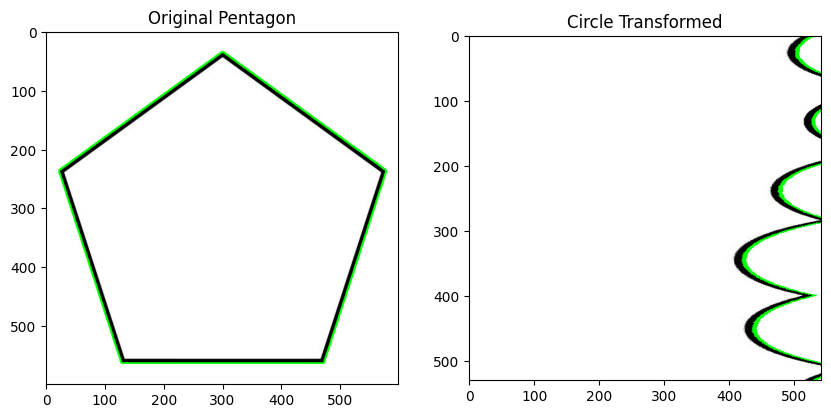

In [ ]:
# Step 1: Install OpenCV
!pip install opencv-python-headless

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

image_path = "/content/pentagon.jpeg"
image = cv2.imread(image_path)

# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect edges in the image
edges = cv2.Canny(gray, 50, 150)

# Find contours of the pentagon
contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw the contour of the pentagon (assuming the largest contour is the pentagon)
pentagon_contour = max(contours, key=cv2.contourArea)
cv2.drawContours(image, [pentagon_contour], -1, (0, 255, 0), 2)

# Approximate the contour to a polygon (we expect 5 vertices for a pentagon)
epsilon = 0.02 * cv2.arcLength(pentagon_contour, True)
approx = cv2.approxPolyDP(pentagon_contour, epsilon, True)

# Get bounding box for the pentagon
x, y, w, h = cv2.boundingRect(approx)

# Warp the pentagon into a circle shape by using polar coordinates
# Center of the bounding box
center = (x + w // 2, y + h // 2)

# Perform warp using polar coordinates
circle_transformed = cv2.warpPolar(image, (w, h), center, max(w, h) // 2, cv2.WARP_FILL_OUTLIERS)

# Convert BGR to RGB for displaying using matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
circle_transformed_rgb = cv2.cvtColor(circle_transformed, cv2.COLOR_BGR2RGB)

# Display the original and transformed images
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Pentagon')

plt.subplot(1, 2, 2)
plt.imshow(circle_transformed_rgb)
plt.title('Circle Transformed')

plt.show()

In [ ]:
import cv2
import numpy as np

# Function to detect a pentagon and overlay a circle
def pentagon_to_circle(image_path, output_path):
    # Load the image
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Edge detection
    edges = cv2.Canny(blurred, 50, 150)

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Loop through contours to find a pentagon
    for contour in contours:
        # Approximate the contour
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        # Check if the contour has 5 vertices (pentagon)
        if len(approx) == 5:
            # Draw the pentagon on the image
            cv2.drawContours(image, [approx], -1, (0, 255, 0), 3)

            # Calculate the minimum enclosing circle of the pentagon
            center, radius = cv2.minEnclosingCircle(contour)
            center = (int(center[0]), int(center[1]))
            radius = int(radius)

            # Draw the circle
            cv2.circle(image, center, radius, (255, 0, 0), 3)

            break  # Stop after finding the first pentagon

    # Save and display the result
    cv2.imwrite(output_path, image)
    print(f"Result saved to {output_path}")

# Example usage
pentagon_to_circle("/content/images.jpeg", "output_circle.jpg")


Result saved to output_circle.jpg


Write a program to scale up or scale down an image by the input dimensions given by user.

Original Dimensions: 1200x800
Enter the new width: 200
Enter the new height: 100


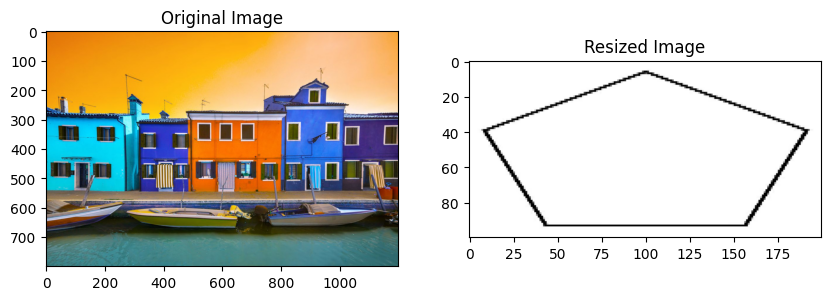

In [ ]:
import cv2
from google.colab import files
import matplotlib.pyplot as plt

def rescale_image(image_path, new_width, new_height):
    image = cv2.imread(image_path)
    resized_image = cv2.resize(image, (new_width, new_height))

    return resized_image


original_image = cv2.imread("/content/colourful-buildings.jpg")
original_height, original_width = original_image.shape[:2]
print(f"Original Dimensions: {original_width}x{original_height}")

new_width = int(input("Enter the new width: "))
new_height = int(input("Enter the new height: "))

resized_image = rescale_image(image_path, new_width, new_height)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title(f'Original Image')

plt.subplot(1, 2, 2)
plt.imshow(resized_image)
plt.title(f'Resized Image')

plt.show()

In [ ]:
import cv2

def scale_image(image_path, output_path, width, height):
    """
    Scales an image to the given dimensions.

    Parameters:
    - image_path: str, path to the input image
    - output_path: str, path to save the scaled image
    - width: int, new width for the scaled image
    - height: int, new height for the scaled image
    """
    # Load the image
    image = cv2.imread(image_path)

    if image is None:
        print("Error: Unable to load image.")
        return

    # Display the original dimensions
    original_dimensions = image.shape[:2]  # (height, width)
    print(f"Original Dimensions: {original_dimensions[1]}x{original_dimensions[0]}")

    # Resize the image
    scaled_image = cv2.resize(image, (width, height), interpolation=cv2.INTER_LINEAR)

    # Display the new dimensions
    print(f"New Dimensions: {width}x{height}")

    # Save the resized image
    cv2.imwrite(output_path, scaled_image)
    print(f"Scaled image saved to {output_path}")

# Input from the user
input_image = input("Enter the path to the input image: ")
output_image = input("Enter the path to save the scaled image: ")
new_width = int(input("Enter the new width: "))
new_height = int(input("Enter the new height: "))

# Scale the image
scale_image(input_image, output_image, new_width, new_height)


Enter the path to the input image: sheep.jpg
Enter the path to save the scaled image: scaled_sheep.jpg
Enter the new width: 500
Enter the new height: 500
Original Dimensions: 960x540
New Dimensions: 500x500
Scaled image saved to scaled_sheep.jpg


Write a program to identify circle in a cluster of rectangles which is enclosed in a bigger frame

Enter the path to the input image: sample.png
Detected 1 circle(s).


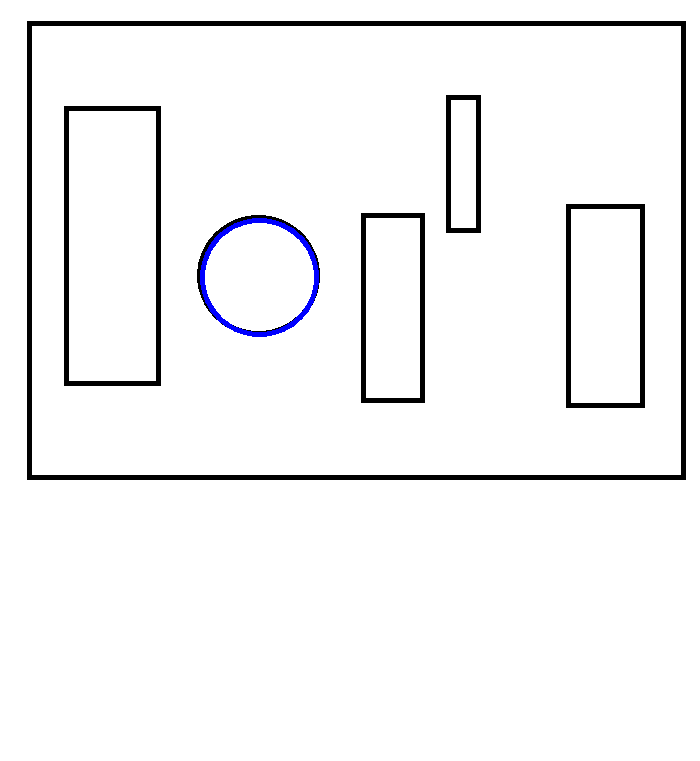

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # For displaying images in Colab

def find_circle_in_rectangles(image_path):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Unable to load image.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur to reduce noise
    blurred = cv2.medianBlur(gray, 5)

    # Detect edges using Canny
    edges = cv2.Canny(blurred, 100, 200)  # Adjust thresholds to reduce noise

    # Detect circles using Hough Circle Transform
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp=1.2,              # Inverse ratio of resolution
        minDist=50,          # Minimum distance between circle centers
        param1=80,          # Higher threshold for edge detection
        param2=50,           # Accumulator threshold for circle detection
        minRadius=40,        # Minimum circle radius (adjust as needed)
        maxRadius=100        # Maximum circle radius (adjust as needed)
    )

    # If circles are found, draw them
    if circles is not None:
        circles = np.uint16(np.around(circles))
        print(f"Detected {len(circles[0])} circle(s).")
        for circle in circles[0, :]:
            center = (circle[0], circle[1])  # Circle center
            radius = circle[2]              # Circle radius

            # Draw the circle outline
            cv2.circle(image, center, radius, (255, 0, 0), 3)
    else:
        print("No circles detected.")

    # Display the output image inline
    cv2_imshow(image)

# Example usage
input_image = input("Enter the path to the input image: ")
find_circle_in_rectangles(input_image)


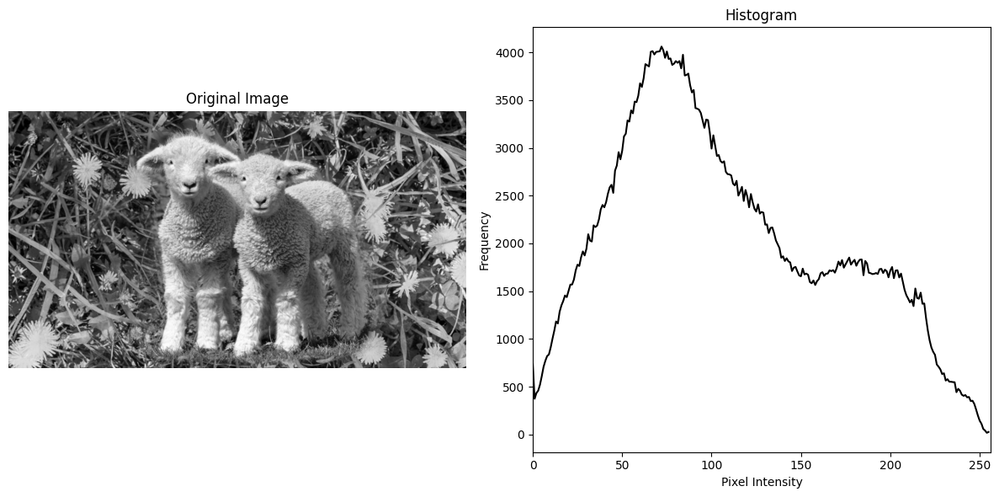

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load the image in grayscale
image = cv2.imread('sheep.jpg', 0)  # Load image as grayscale

# Calculate histogram
histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

# Plot the original image and its histogram
plt.figure(figsize=(12, 6))

# Display the original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Display the histogram
plt.subplot(1, 2, 2)
plt.plot(histogram, color='black')
plt.title('Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.xlim([0, 256])  # Pixel intensity ranges from 0 to 255

plt.tight_layout()
plt.show()
